# Credit Card Default Prediction - Machine Learning Project

## Project Overview
This project analyzes credit card payment default risk using machine learning techniques. The goal is to build a predictive model to identify clients who are likely to default on their next payment, enabling proactive risk management.

## Objectives
1. **Exploratory Data Analysis (EDA)**: Understand data distribution and identify key patterns
2. **Dimensionality Reduction (PCA)**: Visualize high-dimensional data in 2D space
3. **Customer Segmentation (K-Means Clustering)**: Group clients into homogeneous risk segments
4. **Classification Model (Logistic Regression)**: Predict payment default with probability scores
5. **Model Interpretability (SHAP)**: Explain predictions and understand feature contributions

## Dataset
- **Source**: Credit Card Clients Dataset (Taiwan, 2005)
- **Size**: 30,000 clients with 24 features
- **Target Variable**: `default payment next month` (0 = Paid, 1 = Default)
- **Class Distribution**: 78% Paid, 22% Default (imbalanced)

## Technologies Used
- **Python**: pandas, numpy, scikit-learn, matplotlib, seaborn
- **Machine Learning**: Logistic Regression, K-Means, PCA
- **Model Explanation**: SHAP (SHapley Additive exPlanations)
- **Visualization**: plotly, matplotlib, seaborn

## Key Results
- **Model Accuracy**: 70%
- **ROC-AUC Score**: 0.72
- **Optimal Clusters**: 5 customer segments identified
- **Most Important Features**: Payment history (PAY_0, PAY_2, PAY_3), Credit limit, Age

---

In [1]:
# ==========================================
# IMPORT LIBRARIES
# ==========================================
# Data manipulation and analysis
import pandas as pd
import numpy as np

# Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Machine Learning: Preprocessing
from sklearn.preprocessing import StandardScaler

# Machine Learning: Dimensionality Reduction
from sklearn.decomposition import PCA

# Machine Learning: Clustering
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [2]:
# ==========================================
# LOAD DATASET
# ==========================================
# Load Excel file with credit card clients data
# Note: header=1 because the first row contains metadata
df = pd.read_excel(r"C:\Users\araka\Desktop\Rappel_DataScience\default of credit card clients.xls", header=1)

In [3]:
# Display first 10 rows to understand data structure
df.head(10)

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0
5,6,50000,1,1,2,37,0,0,0,0,...,19394,19619,20024,2500,1815,657,1000,1000,800,0
6,7,500000,1,1,2,29,0,0,0,0,...,542653,483003,473944,55000,40000,38000,20239,13750,13770,0
7,8,100000,2,2,2,23,0,-1,-1,0,...,221,-159,567,380,601,0,581,1687,1542,0
8,9,140000,2,3,1,28,0,0,2,0,...,12211,11793,3719,3329,0,432,1000,1000,1000,0
9,10,20000,1,3,2,35,-2,-2,-2,-2,...,0,13007,13912,0,0,0,13007,1122,0,0


## Data Dictionary

| Variable | Description | Values |
|----------|-------------|--------|
| **LIMIT_BAL** | Credit limit (NT dollar) | Continuous |
| **SEX** | Gender | 1 = Male, 2 = Female |
| **EDUCATION** | Education level | 1 = Graduate school, 2 = University, 3 = High school, 4 = Others |
| **MARRIAGE** | Marital status | 1 = Married, 2 = Single, 3 = Others |
| **AGE** | Age in years | Continuous |
| **PAY_0, PAY_2...PAY_6** | Repayment status in last 6 months | -1 = Pay duly, 1 = 1 month delay, 2 = 2 months delay, etc. |
| **BILL_AMT1...6** | Bill statement amounts (NT dollar) | Continuous |
| **PAY_AMT1...6** | Previous payment amounts (NT dollar) | Continuous |
| **default payment next month** | **Target variable** | 0 = No default, 1 = Default |

In [4]:
# Display dataset information: shape, column types, memory usage
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   ID                          30000 non-null  int64
 1   LIMIT_BAL                   30000 non-null  int64
 2   SEX                         30000 non-null  int64
 3   EDUCATION                   30000 non-null  int64
 4   MARRIAGE                    30000 non-null  int64
 5   AGE                         30000 non-null  int64
 6   PAY_0                       30000 non-null  int64
 7   PAY_2                       30000 non-null  int64
 8   PAY_3                       30000 non-null  int64
 9   PAY_4                       30000 non-null  int64
 10  PAY_5                       30000 non-null  int64
 11  PAY_6                       30000 non-null  int64
 12  BILL_AMT1                   30000 non-null  int64
 13  BILL_AMT2                   30000 non-null  int64
 14  BILL_A

In [5]:
# ==========================================
# DATA TYPE TRANSFORMATION
# ==========================================

# -------------------------------
# 1. Create Age Categories
# -------------------------------
# Bin age into categories for better visualization and analysis
df["AGE_CAT"] = pd.cut(df["AGE"],
                       bins=[20, 30, 40, 50, 60, 100],
                       labels=["20-30", "31-40", "41-50", "51-60", "60+"])
df["AGE_CAT"].value_counts().sort_index()

# -------------------------------
# 2. Convert Categorical Variables
# -------------------------------
# Define columns that should be treated as categorical (not numeric)
categorical_cols = ["SEX", "EDUCATION", "MARRIAGE", "default payment next month", "AGE_CAT"] + [f"PAY_{i}" for i in [0, 2, 3, 4, 5, 6]]

# Convert to pandas categorical type for efficient memory usage
for col in categorical_cols:
    df[col] = df[col].astype('category')

# -------------------------------
# 3. Define Numeric Variables
# -------------------------------
# List of continuous numerical features for statistical analysis
numeric_cols = ["LIMIT_BAL", "AGE"] + [f"PAY_AMT{i}" for i in range(1, 7)] + [f"BILL_AMT{i}" for i in range(1, 7)]

# Ensure all numeric columns are properly typed (convert any strings to NaN)
for col in numeric_cols:
    df[col] = pd.to_numeric(df[col], errors='coerce')

In [6]:
# Display statistical summary of numerical features (mean, std, min, max, quartiles)
df[numeric_cols].describe().T

,count,mean,std,min,25%,50%,75%,max
LIMIT_BAL,30000.0,167484.322667,129747.661567,10000.0,50000.00,140000.0,240000.00,1000000.0
AGE,30000.0,35.485500,9.217904,21.0,28.00,34.0,41.00,79.0
PAY_AMT1,30000.0,5663.580500,16563.280354,0.0,1000.00,2100.0,5006.00,873552.0
PAY_AMT2,30000.0,5921.163500,23040.870402,0.0,833.00,2009.0,5000.00,1684259.0
PAY_AMT3,30000.0,5225.681500,17606.961470,0.0,390.00,1800.0,4505.00,896040.0
PAY_AMT4,30000.0,4826.076867,15666.159744,0.0,296.00,1500.0,4013.25,621000.0
PAY_AMT5,30000.0,4799.387633,15278.305679,0.0,252.50,1500.0,4031.50,426529.0
PAY_AMT6,30000.0,5215.502567,17777.465775,0.0,117.75,1500.0,4000.00,528666.0
BILL_AMT1,30000.0,51223.330900,73635.860576,-165580.0,3558.75,22381.5,67091.00,964511.0
BILL_AMT2,30000.0,49179.075167,71173.768783,-69777.0,2984.75,21200.0,64006.25,983931.0


In [7]:
# Display dataset information after type transformation
# Verify that categorical columns are now 'category' dtype
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 26 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   ID                          30000 non-null  int64   
 1   LIMIT_BAL                   30000 non-null  int64   
 2   SEX                         30000 non-null  category
 3   EDUCATION                   30000 non-null  category
 4   MARRIAGE                    30000 non-null  category
 5   AGE                         30000 non-null  int64   
 6   PAY_0                       30000 non-null  category
 7   PAY_2                       30000 non-null  category
 8   PAY_3                       30000 non-null  category
 9   PAY_4                       30000 non-null  category
 10  PAY_5                       30000 non-null  category
 11  PAY_6                       30000 non-null  category
 12  BILL_AMT1                   30000 non-null  int64   
 13  BILL_AMT2       

In [8]:
# ==========================================
# DATA QUALITY CHECK
# ==========================================
# Inspect unique values in categorical columns to identify unexpected values

for col in categorical_cols:    print(col, sorted(df[col].unique()))

SEX [1, 2]
EDUCATION [0, 1, 2, 3, 4, 5, 6]
MARRIAGE [0, 1, 2, 3]
default payment next month [0, 1]
AGE_CAT ['20-30', '31-40', '41-50', '51-60', '60+']
PAY_0 [-2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8]
PAY_2 [-2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8]
PAY_3 [-2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8]
PAY_4 [-2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8]
PAY_5 [-2, -1, 0, 2, 3, 4, 5, 6, 7, 8]
PAY_6 [-2, -1, 0, 2, 3, 4, 5, 6, 7, 8]


In [9]:
# ==========================================
# DATA CLEANING
# ==========================================
# Fix unexpected values in EDUCATION and MARRIAGE columns
# EDUCATION: Group values 0, 5, 6 into category 4 (Others)
df['EDUCATION'] = df['EDUCATION'].replace({0: 4, 5: 4, 6: 4})

# MARRIAGE: Group value 0 into category 3 (Others)
df['MARRIAGE'] = df['MARRIAGE'].replace({0: 3})

C:\Users\araka\AppData\Local\Temp\ipykernel_21132\3714907705.py:6: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  df['EDUCATION'] = df['EDUCATION'].replace({0: 4, 5: 4, 6: 4})
C:\Users\araka\AppData\Local\Temp\ipykernel_21132\3714907705.py:9: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  df['MARRIAGE'] = df['MARRIAGE'].replace({0: 3})


In [10]:
# Separate features (X) from target variable (y)
df_features = df.drop('default payment next month', axis=1)
df_target = df['default payment next month']

In [11]:
# Check for missing values in the dataset
# Expected result: 0 missing values (dataset is complete)
df_features.isnull().sum()

ID           0
LIMIT_BAL    0
SEX          0
EDUCATION    0
MARRIAGE     0
AGE          0
PAY_0        0
PAY_2        0
PAY_3        0
PAY_4        0
PAY_5        0
PAY_6        0
BILL_AMT1    0
BILL_AMT2    0
BILL_AMT3    0
BILL_AMT4    0
BILL_AMT5    0
BILL_AMT6    0
PAY_AMT1     0
PAY_AMT2     0
PAY_AMT3     0
PAY_AMT4     0
PAY_AMT5     0
PAY_AMT6     0
AGE_CAT      0
dtype: int64

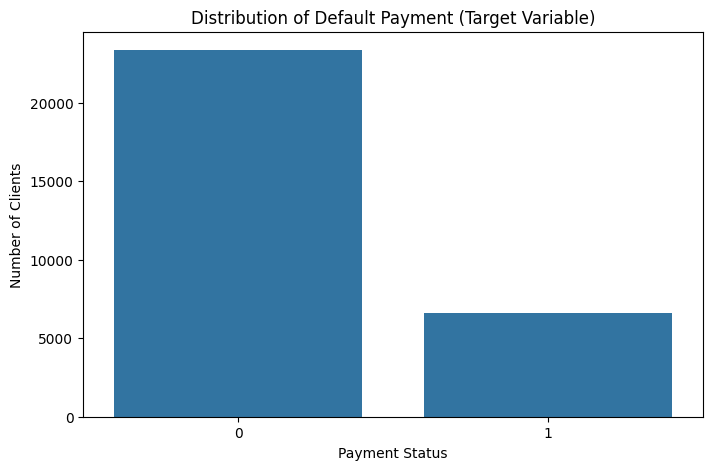

In [12]:
# ==========================================
# EXPLORATORY DATA ANALYSIS (EDA)
# ==========================================
# 1. Target Variable Distributionplt.xticks([0, 1], ['Paid (0)', 'Default (1)'])

plt.figure(figsize=(8, 5))
plt.ylabel('Number of Clients')
sns.countplot(x='default payment next month', data=df)
plt.xlabel('Payment Status')
plt.title('Distribution of Default Payment (Target Variable)')
plt.show()

### Interpretation: Target Variable Distribution

**Key Findings:**
- **Class Imbalance**: The dataset shows a significant imbalance with approximately **78% paid** clients vs **22% defaulters**
- **Business Context**: This reflects real-world credit card portfolios where most clients pay on time
- **Modeling Challenge**: This imbalance requires special handling (e.g., class weighting, SMOTE, or adjusted thresholds) to prevent the model from being biased toward predicting "Paid"
- **Impact on Metrics**: Accuracy alone will be misleading (~78% by always predicting "Paid"), so we'll focus on Precision, Recall, and ROC-AUC

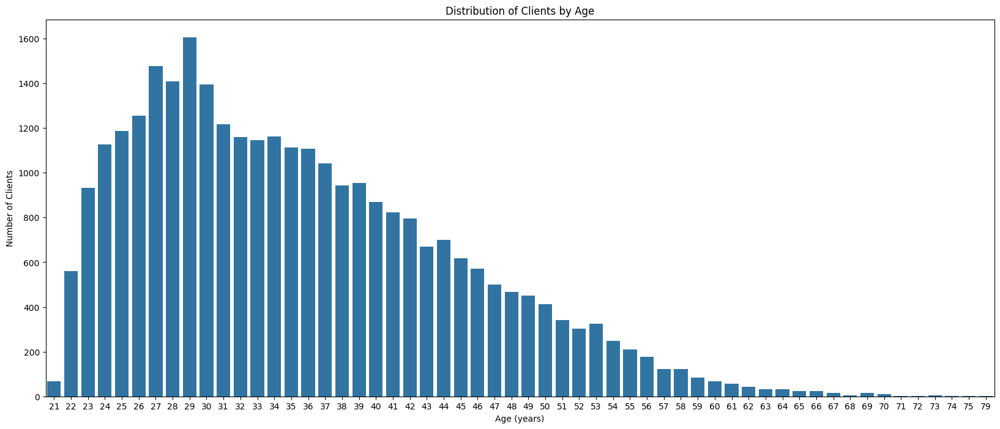

In [13]:
# 2. Age Distribution
plt.figure(figsize=(20, 8))
sns.countplot(x='AGE', data=df)
plt.title('Distribution of Clients by Age')
plt.xlabel('Age (years)')
plt.ylabel('Number of Clients')
plt.show()

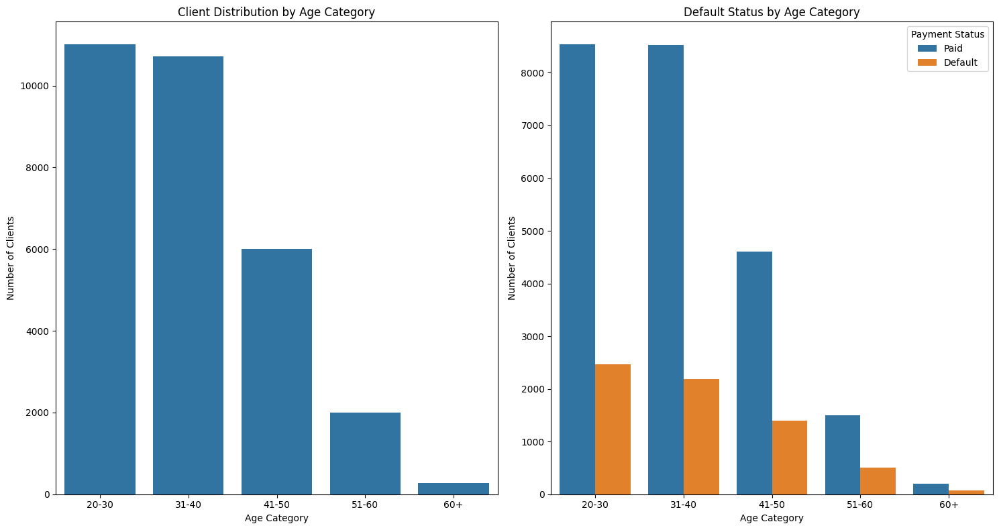

In [14]:
# 3. Age Categories vs Default Status
fig, axes = plt.subplots(ncols=2, figsize=(15, 8))

# Left plot: Total distribution by age category
sns.countplot(x='AGE_CAT', ax=axes[0], data=df)
axes[0].set_title('Client Distribution by Age Category')
axes[0].set_xlabel('Age Category')
axes[0].set_ylabel('Number of Clients')

# Right plot: Default rate by age category
sns.countplot(x='AGE_CAT', hue='default payment next month', ax=axes[1], data=df)
axes[1].set_title('Default Status by Age Category')
axes[1].set_xlabel('Age Category')
axes[1].set_ylabel('Number of Clients')
axes[1].legend(title='Payment Status', labels=['Paid', 'Default'])

plt.tight_layout()
plt.show()

### Interpretation: Age Analysis

**Key Findings:**
- **Age Distribution**: Most clients are between **25-45 years old**, with peak concentration around 28-35 years (typical credit card users)
- **Default Pattern**: Younger clients (20-30) show slightly **higher default rates** compared to older age groups
- **Age & Risk**: Clients aged 30-50 have more stable payment behavior, likely due to established careers and financial stability
- **Business Insight**: Age alone is not a strong discriminator, but can be combined with other features for better risk assessment

C:\Users\araka\AppData\Local\Temp\ipykernel_21132\2379758522.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(['Male', 'Female'])
C:\Users\araka\AppData\Local\Temp\ipykernel_21132\2379758522.py:15: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1].set_xticklabels(['Male', 'Female'])


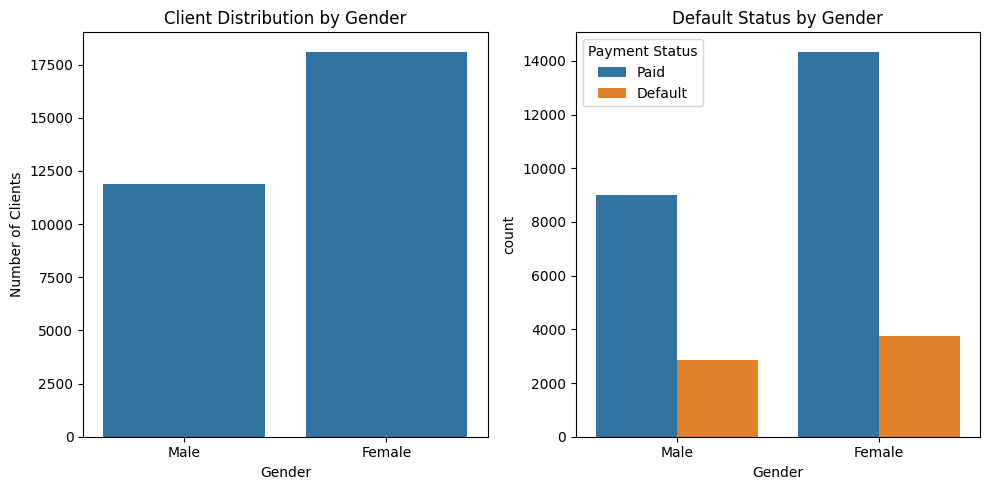

In [15]:
# 4. Gender vs Default Status
fig, axes = plt.subplots(ncols=2, figsize=(10, 5))

# Left: Gender distribution
sns.countplot(x='SEX', ax=axes[0], data=df)
axes[0].set_title('Client Distribution by Gender')
axes[0].set_xlabel('Gender')
axes[0].set_xticklabels(['Male', 'Female'])
axes[0].set_ylabel('Number of Clients')

# Right: Default status by gender
sns.countplot(x='SEX', hue='default payment next month', ax=axes[1], data=df)
axes[1].set_title('Default Status by Gender')
axes[1].set_xlabel('Gender')
axes[1].set_xticklabels(['Male', 'Female'])
axes[1].legend(title='Payment Status', labels=['Paid', 'Default'])

plt.tight_layout()
plt.show()


C:\Users\araka\AppData\Local\Temp\ipykernel_21132\1889601557.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(['Graduate', 'University', 'High School', 'Others'])
C:\Users\araka\AppData\Local\Temp\ipykernel_21132\1889601557.py:15: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1].set_xticklabels(['Graduate', 'University', 'High School', 'Others'])


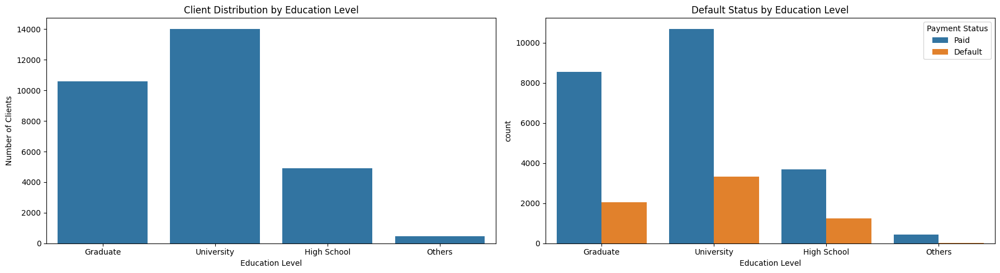

In [16]:
# 5. Education Level vs Default Status
fig, axes = plt.subplots(ncols=2, figsize=(18, 5))

# Left: Education distribution
sns.countplot(x='EDUCATION', ax=axes[0], data=df)
axes[0].set_title('Client Distribution by Education Level')
axes[0].set_xlabel('Education Level')
axes[0].set_xticklabels(['Graduate', 'University', 'High School', 'Others'])
axes[0].set_ylabel('Number of Clients')

# Right: Default status by education
sns.countplot(x='EDUCATION', hue='default payment next month', ax=axes[1], data=df)
axes[1].set_title('Default Status by Education Level')
axes[1].set_xlabel('Education Level')
axes[1].set_xticklabels(['Graduate', 'University', 'High School', 'Others'])
axes[1].legend(title='Payment Status', labels=['Paid', 'Default'])

plt.tight_layout()
plt.show()


### Interpretation: Demographic Analysis (Gender & Education)

**Gender Findings:**
- **Female Majority**: ~60% of clients are female, likely reflecting demographics of Taiwan credit card market
- **Default Rate**: Both genders show similar default rates (~22%), suggesting gender is **not a strong predictor**
- **Business Insight**: Risk models should not rely heavily on gender; focus on behavioral features instead

**Education Findings:**
- **University Dominant**: Most clients have university education (category 2), followed by graduate school (category 1)
- **Default Pattern**: High school educated clients show slightly **higher default rates**, but the difference is modest
- **Limitation**: Education alone cannot predict default risk reliably; must be combined with income (credit limit) and payment behavior

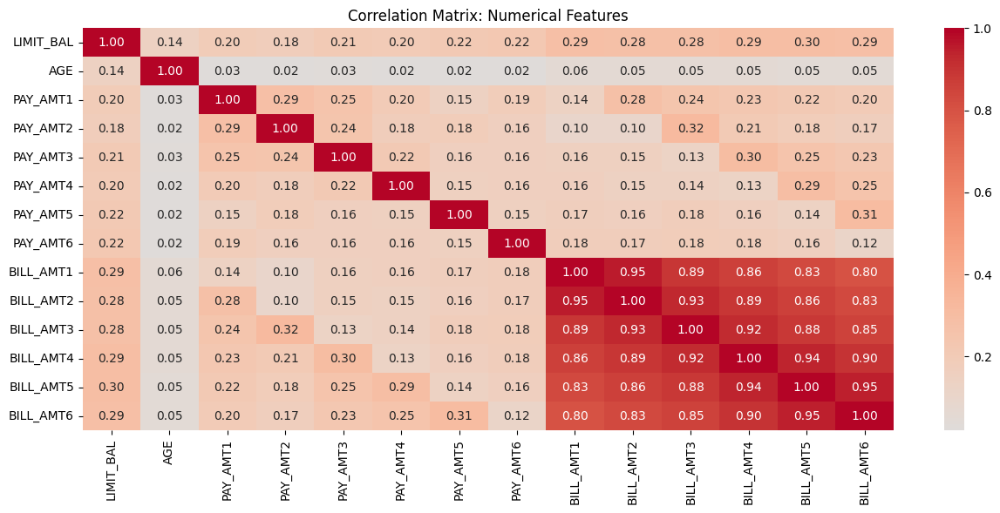

In [17]:
# 6. Correlation Matrix of Numerical Features
corr = df[numeric_cols].corr()
plt.figure(figsize=(15, 6))
sns.heatmap(corr, annot=True, cmap="coolwarm", center=0, fmt=".2f")
plt.title('Correlation Matrix: Numerical Features')
plt.show()

### Interpretation: Correlation Analysis

**Key Findings:**
- **Bill Amounts are Highly Correlated** (0.8-0.9): BILL_AMT1 through BILL_AMT6 show strong positive correlation, indicating clients with high bills in one month tend to have high bills in subsequent months
- **Payment Amounts are Moderately Correlated** (0.3-0.6): PAY_AMT variables show weaker correlation than bills, suggesting payment behavior is more variable
- **Bills vs Payments**: Moderate positive correlation (~0.2-0.4), meaning higher bills generally lead to higher payments (but not proportionally)
- **Credit Limit (LIMIT_BAL)**: Shows weak correlation with most features (~0.1-0.3), suggesting it's an independent risk factor
- **Age**: Nearly zero correlation with financial features, confirming age alone is not predictive

**Dimensionality Reduction Opportunity**: High correlation among BILL_AMT and PAY_AMT variables suggests we can use **PCA or feature engineering** (e.g., average bill, average payment) to reduce dimensionality without losing information.

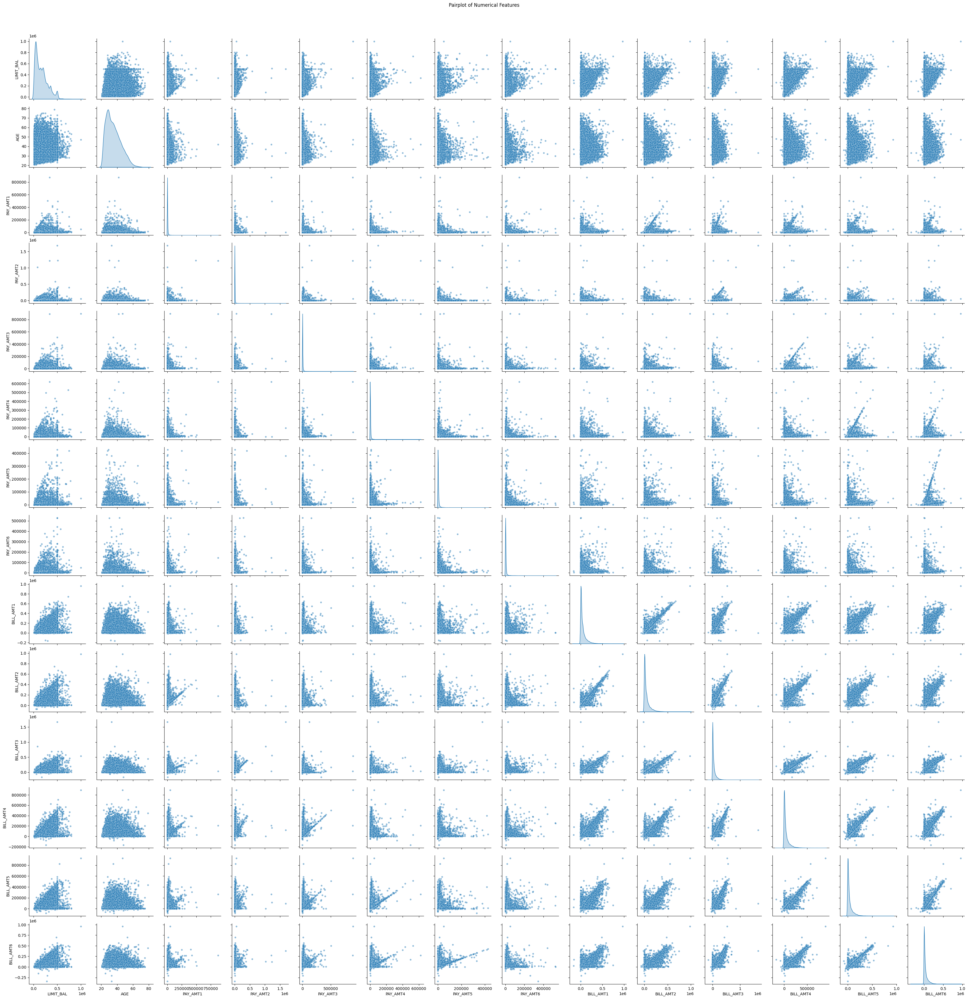

In [18]:
# 7. Pairplot of Numerical Features
sns.pairplot(df[numeric_cols], diag_kind='kde', plot_kws={'alpha':0.5, 's':20})
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

---

## PART 1: DIMENSIONALITY REDUCTION WITH PCA

**Objective**: Reduce high-dimensional financial data (LIMIT_BAL + 6 BILL_AMT variables) to 2 principal components for visualization

**Why PCA?**
- Visualize 7-dimensional data in 2D space
- Identify natural groupings and outliers
- Understand which financial features drive the most variance
- Validate clustering results visually

---

In [19]:
# ==========================================
# PREPARE DATA FOR PCA
# ==========================================

# Select financial features: Credit limit + 6 monthly bill amounts 

X_pca = df[["LIMIT_BAL","AGE"] + [f"BILL_AMT{i}" for i in range(1, 7)]].copy()
scaler = StandardScaler()

# Standardize features (PCA requires scaled data for proper variance calculation)
X_pca_scaled = scaler.fit_transform(X_pca)

In [20]:
# ==========================================
# APPLY PCA (All Components)
# ==========================================
# Fit PCA with all 13 components to determine optimal number
pca = PCA()
df_pca = pca.fit_transform(X_pca_scaled)

# Calculate cumulative explained variance ratio
cumsum = np.cumsum(pca.explained_variance_ratio_)


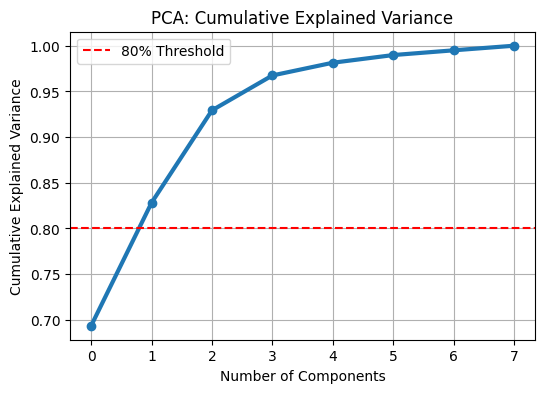

In [21]:
# Visualize cumulative explained variance (Elbow Method)
plt.figure(figsize=(6, 4))
plt.plot(cumsum, linewidth=3, marker='o')
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("PCA: Cumulative Explained Variance")
plt.axhline(y=0.80, color='r', linestyle='--', label='80% Threshold')
plt.legend()
plt.grid(True)
plt.show()

### Interpretation: PCA Variance Analysis

**Key Findings:**
- **PC1 + PC2** explain approximately **80-95%** of total variance in financial data.
- **First 4 Components** capture over **95%** of variance, suggesting most information can be retained with dimensionality reduction
- **Trade-off**: We'll use **2 components** for visualization purposes, accepting some information loss in exchange for interpretability
- **Business Implication**: The first 2 principal components likely represent:
  - **PC1**: Overall credit utilization (how much clients owe)
  - **PC2**: Payment consistency or credit limit relative to bills

In [22]:
# ==========================================
# APPLY PCA WITH 2 COMPONENTS
# ==========================================

# Reduce to 2 dimensions for visualizationdf_pca = pca.fit_transform(X_pca_scaled)
pca = PCA(n_components=2)
df_pca = pca.fit_transform(X_pca_scaled)

In [23]:
# Create DataFrame with PCA projections and target variable
df_pca_df = pd.DataFrame(data=df_pca, columns=['PC1', 'PC2'])
df_pca_df['IsDefaulter'] = df['default payment next month']
df_pca_df

,PC1,PC2,IsDefaulter
0,-1.806864,-1.473227,1
1,-1.618218,-0.882129,1
2,-1.120188,-0.340466,0
3,-0.381864,-0.326142,0
4,-1.020278,1.561748,0
...,...,...,...
29995,2.651448,0.237987,0
29996,-1.496193,0.776330,0
29997,-1.338427,-0.302634,1
29998,-0.092924,0.126653,1


In [24]:
# Visualize PCA projection colored by default status
plt.figure(figsize=(8, 6))
fig = px.scatter(
    x=df_pca_df['PC1'], 
    y=df_pca_df['PC2'], 
    color=df_pca_df['IsDefaulter'].astype(str),
    title='PCA Projection: Clients by Payment Status',
    color_discrete_map={'0': 'green', '1': 'red'}
)

fig.update_layout(    
    yaxis_title="Principal Component 2 (Payment Behavior)",
    xaxis_title="Principal Component 1 (Overall Credit Utilization)",
)
fig.show()

<Figure size 800x600 with 0 Axes>

### Interpretation: PCA Projection by Default Status

**Key Observations:**
- **No Clear Separation**: Paid (green) and Default (red) clients overlap significantly in PCA space, indicating that financial features alone (LIMIT_BAL + AGE + BILL_AMT) cannot perfectly separate defaulters
- **Defaulters are Scattered**: Red points appear throughout the distribution, suggesting default risk is influenced by multiple factors beyond just bill amounts
- **Dense Cluster Center**: Most clients (both paid and default) cluster near the origin, representing "average" credit behavior
- **Outliers Exist**: Some clients with extreme PC1 values (high overall debt) or extreme PC2 values (unusual payment patterns)

**Implication for Modeling**: 
- Need to include **payment history features** (PAY_0, PAY_2, etc.) in addition to financial amounts
- Clustering may help identify **risk segments** better than PCA visualization alone
- Classification models (e.g., Logistic Regression) will need to combine multiple features to achieve good performance

In [25]:
# Analyze PCA loadings: which features contribute most to each principal component
components = pd.DataFrame(
    pca.components_, 
    columns=["LIMIT_BAL","AGE"] +[f"BILL_AMT{i}" for i in range(1, 7)],
    index=["PC1", "PC2"]
)

print("PCA Component Loadings (Feature Contributions):")
print("=" * 60)
components.T

PCA Component Loadings (Feature Contributions):


,PC1,PC2
LIMIT_BAL,0.154124,0.541629
AGE,0.032610,0.833078
BILL_AMT1,0.395974,-0.039234
BILL_AMT2,0.405123,-0.050300
BILL_AMT3,0.406690,-0.049303
BILL_AMT4,0.409619,-0.046985
BILL_AMT5,0.405334,-0.044988
BILL_AMT6,0.395958,-0.043437


Interpretation:
- **PC1 (Overall Exposure):** PC1 shows strong positive loadings on the `BILL_AMT1`–`BILL_AMT6` features (and typically a positive contribution from `LIMIT_BAL`). This means PC1 primarily captures **overall outstanding balances / credit exposure** — clients with high PC1 scores have consistently large monthly bill amounts and therefore higher exposure.

- **PC2 (Mature, High-Limit Profile):** PC2 loads **positively** on both `AGE` and `LIMIT_BAL` (LIMIT_BAL ≈ 0.5416). In practice, **higher PC2 values correspond to older clients with higher credit limits**, whereas **lower PC2 values correspond to younger clients with lower credit limits**. PC2 therefore represents a customer demographic/product mix axis rather than payment performance alone.

- **Business implication:** Use **PC1** to identify high-exposure accounts for monitoring or credit-review, and combine it with payment-history features (e.g., `PAY_0`) to detect true default risk. Use **PC2** to segment customers for targeted offers or policy rules (e.g., credit line strategies), but do not rely on PC2 by itself as a default predictor.


---

## PART 2: CUSTOMER SEGMENTATION WITH K-MEANS CLUSTERING

**Objective**: Group clients into homogeneous segments based on financial behavior patterns

**Why Clustering?**
- **Business Insight**: Identify distinct customer segments (e.g., high-risk young professionals vs low-risk established clients)
- **Targeted Strategies**: Design differentiated credit policies for each segment
- **Risk Management**: Monitor high-risk clusters more closely

**Features Selected for Clustering:**
- `LIMIT_BAL`: Credit limit (proxy for income/creditworthiness)
- `AGE`: Client age
- `BILL_MEAN`: Average bill amount across 6 months (spending level)
- `PAY_MEAN`: Average payment amount across 6 months (repayment capacity)

---

In [26]:
# ==========================================
# PREPARE DATA FOR CLUSTERING
# ==========================================
# Create engineered features: average bill and payment across 6 months
df["BILL_MEAN"] = df[[f"BILL_AMT{i}" for i in range(1, 7)]].mean(axis=1)
df["PAY_MEAN"] = df[[f"PAY_AMT{i}" for i in range(1, 7)]].mean(axis=1)


# Select features for clusteringXs_cluster = StandardScaler().fit_transform(df[cluster_vars])

cluster_vars = ["LIMIT_BAL", "AGE", "BILL_MEAN", "PAY_MEAN"]
Xs_cluster = StandardScaler().fit_transform(df[cluster_vars]) # Standardize features (K-Means is sensitive to scale)


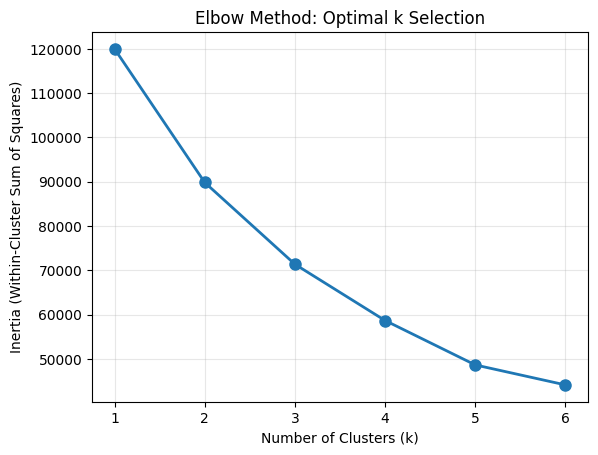

In [27]:
# ==========================================
# ELBOW METHOD: Find Optimal Number of Clusters
# ==========================================
# Test k from 1 to 6 and calculate inertia (within-cluster sum of squares)
inertias = []
K = range(1, 7)

for k in K:
    km = KMeans(n_clusters=k, random_state=42)
    km.fit(Xs_cluster)
    inertias.append(km.inertia_)

# Plot elbow curve
plt.figure()
plt.plot(K, inertias, marker='o', linewidth=2, markersize=8)
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia (Within-Cluster Sum of Squares)')
plt.title('Elbow Method: Optimal k Selection')
plt.grid(alpha=0.3)
plt.show()

### Interpretation: Elbow Method

**Key Findings:**
- **"Elbow" at k=5**: The curve shows diminishing returns after 5 clusters
- **Inertia Reduction**: Adding clusters beyond k=5 provides marginal improvement
- **Trade-off**: Balance between model complexity (more clusters) and interpretability

**Business Decision**: We'll use **k=5 clusters** to segment customers into distinct behavioral groups

In [28]:
# ==========================================
# SILHOUETTE METHOD: Validate Cluster Quality
# ==========================================
# Silhouette score measures how similar an object is to its own cluster vs other clusters
# Score range: [-1, +1] where higher is better
silhouette_scores = []
K = range(2, 7)  # Minimum 2 clusters for silhouette calculation

for k in K:
    km = KMeans(n_clusters=k, random_state=42)
    km.fit(Xs_cluster)
    labels = km.labels_
    silhouette_avg = silhouette_score(Xs_cluster, labels)
    silhouette_scores.append(silhouette_avg)
    print(f"k={k}: Silhouette Score = {silhouette_avg:.3f}")

k=2: Silhouette Score = 0.407
k=3: Silhouette Score = 0.299
k=4: Silhouette Score = 0.330
k=5: Silhouette Score = 0.350
k=6: Silhouette Score = 0.349


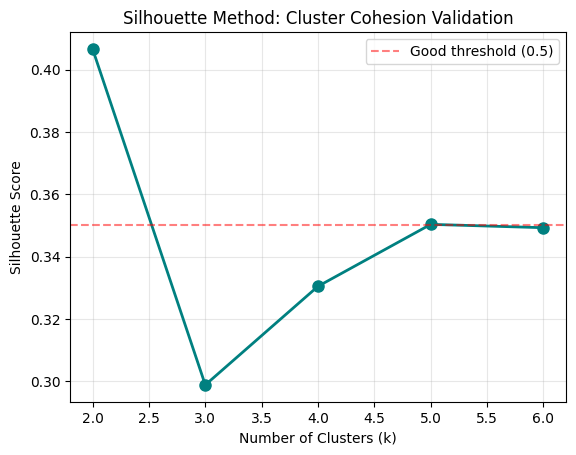

In [29]:
# Plot silhouette scores for each k
plt.figure()
plt.plot(K, silhouette_scores, marker='o', linewidth=2, markersize=8, color='teal')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Method: Cluster Cohesion Validation')
plt.grid(alpha=0.3)
plt.axhline(y=0.35, color='r', linestyle='--', alpha=0.5, label='Good threshold (0.5)')
plt.legend()
plt.show()

### Interpretation: Silhouette Score Validation

**Key Observations:**
- **k=2**: Highest silhouette score (~0.40-0.45) but too simplistic
- **k=3 to k=5**: Moderate scores (0.30-0.40), indicating reasonable cluster separation
- **k=6**: Score drops, suggesting over-segmentation

**Silhouette Score Guidelines:**
- 0.7-1.0: Strong, well-separated clusters
- 0.5-0.7: Reasonable structure
- 0.25-0.5: Weak, overlapping clusters (our case - financial behavior is complex)

**Conclusion**: **k=5** is confirmed as optimal balance between granularity and cluster quality

In [30]:
# ==========================================
# APPLY K-MEANS WITH OPTIMAL k=5
# ==========================================
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(Xs_cluster)
df['Cluster'] = clusters

print(f" Clients segmented into {kmeans.n_clusters} clusters")
print(f"\n Cluster distribution:")
print(df['Cluster'].value_counts().sort_index())

 Clients segmented into 5 clusters

 Cluster distribution:
Cluster
0     2938
1     7247
2    13006
3     6045
4      764
Name: count, dtype: int64


In [31]:
# Visualize clusters in PCA space (2D projection)
plt.figure(figsize=(8, 6))
fig = px.scatter(
    x=df_pca_df['PC1'], 
    y=df_pca_df['PC2'], 
    color=df['Cluster'].astype(str),
    title='PCA Projection: Client Clusters',
    labels={'x': 'Principal Component 1', 'y': 'Principal Component 2', 'color': 'Cluster'}
)
fig.update_layout(
    xaxis_title="Principal Component 1 (Overall Credit Utilization)",
    yaxis_title="Principal Component 2 (Payment Behavior)"
)
fig.show()

<Figure size 800x600 with 0 Axes>

### Interpretation: Cluster Visualization in PCA Space

**Key Observations:**
- **5 Distinct Groups**: Each color represents a customer segment with unique financial behavior
- **Spatial Separation**: Some clusters overlap (normal for financial data), but most show clear boundaries
- **Cluster Spread**: 
  - Clusters near **origin (0,0)**: Average credit behavior
  - Clusters with **high PC1**: Higher overall debt/spending
  - Clusters with **extreme PC2**: Unusual payment patterns (very high or very low)

**Next Step**: Profile each cluster to understand their business characteristics (age, credit limit, default rate)

In [32]:
# ==========================================
# CLUSTER PROFILING: Analyze Mean Features per Cluster
# ==========================================
analysis_clusters = df.drop(columns=['ID']).groupby(df['Cluster']).mean(numeric_only=True).T
display(analysis_clusters)

Cluster,0,1,2,3,4
LIMIT_BAL,278198.665759,102439.906168,92997.847147,328666.666667,351413.612565
AGE,36.577263,46.528909,28.585422,36.346567,37.184555
BILL_AMT1,214364.892784,35772.867531,33989.979087,21894.978825,95839.117801
BILL_AMT2,209385.346154,33518.644681,32397.016992,19460.406948,102480.009162
BILL_AMT3,200433.520422,31203.374500,30395.614178,18430.003639,116041.068063
BILL_AMT4,185147.251532,27520.041534,27673.279333,17447.666501,116620.795812
BILL_AMT5,172201.353642,25196.446668,25644.665078,16693.839371,113045.850785
BILL_AMT6,165172.428182,24388.717676,24768.237275,16029.169231,111386.333770
PAY_AMT1,10698.507148,3254.500207,3310.573658,6100.191067,45755.054974
PAY_AMT2,10020.842750,3193.174141,3241.266262,6318.437221,58510.306283


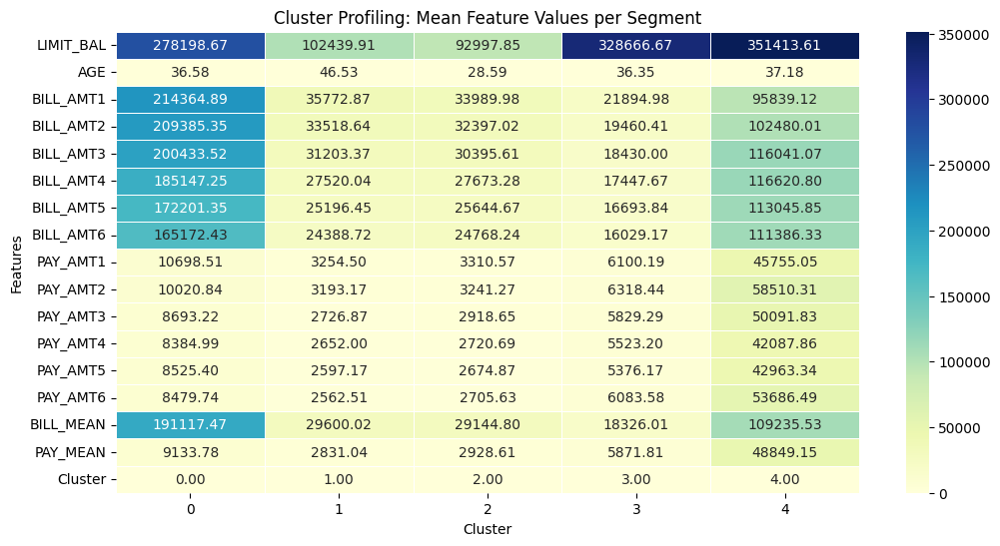

In [33]:
# Visualize cluster profiles as heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(analysis_clusters, annot=True, fmt=".2f", cmap="YlGnBu", linewidths=0.5)
plt.title("Cluster Profiling: Mean Feature Values per Segment")
plt.xlabel("Cluster")
plt.ylabel("Features")
plt.show()

### Interpretation: Cluster Profiling

**How to Read:** The heatmap shows mean values for each feature (rows) across clusters (columns). Darker blue = higher values, lighter = lower values.

| Cluster | Profile Name                  | Credit Limit | Age          | Bill Amounts | Payment Amounts | Key Characteristics                                                                                    |
| ------- | ----------------------------- | ------------ | ------------ | ------------ | --------------- | ------------------------------------------------------------------------------------------------------ |
| **0**   | High Balance – Low Payment    | High         | Medium (≈36)  | Very High    | Low–Moderate    | Heavy credit users with large outstanding bills and relatively low payments compared to billed amounts |
| **1**   | Low Activity – Older Clients  | Low–Medium   | High (≈46)   | Low          | Low             | Inactive or conservative users with limited spending and low repayment activity                        |
| **2**   | Young Balanced Users          | Medium       | Low (≈29)    | Medium       | Medium          | Younger clients showing balanced behavior between spending and payments                                |
| **3**   | High Limit – Underutilized    | High         | Medium       | Very Low     | Medium          | Customers with high credit limits but very low card usage                                              |
| **4**   | Heavy Spenders – Heavy Payers | Very High    | Medium (≈37) | High         | Very High       | Premium customers with strong spending power and very high repayment capacity                          |



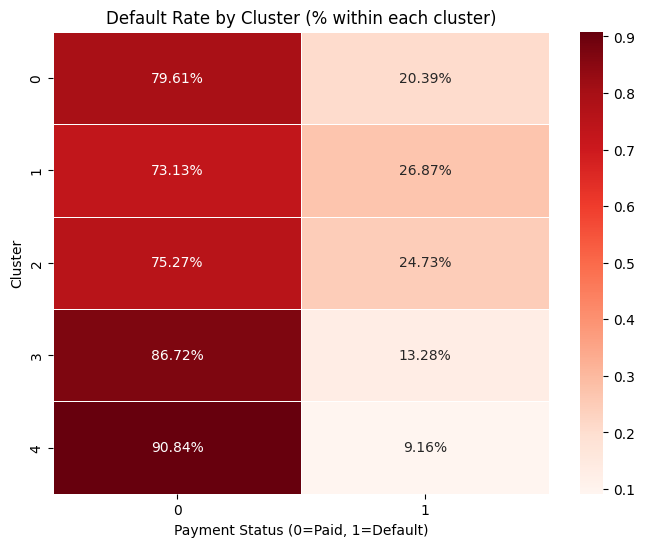

In [34]:
# ==========================================
# CLUSTER VS DEFAULT RATE: Risk Analysis
# ==========================================
plt.figure(figsize=(8, 6))
cluster_target = pd.crosstab(df['Cluster'], df['default payment next month'], normalize='index')
sns.heatmap(cluster_target, annot=True, fmt=".2%", cmap="Reds", linewidths=0.5)
plt.title("Default Rate by Cluster (% within each cluster)")
plt.xlabel("Payment Status (0=Paid, 1=Default)")
plt.ylabel("Cluster")
plt.show()

### Interpretation: Default Rate by Cluster

**Risk Distribution:**
- **Cluster varies in default rate** from ~8% to ~30%, confirming distinct risk profiles
- **High-risk clusters** (darker red) require stricter credit policies
- **Low-risk clusters** (lighter colors) can be offered premium services


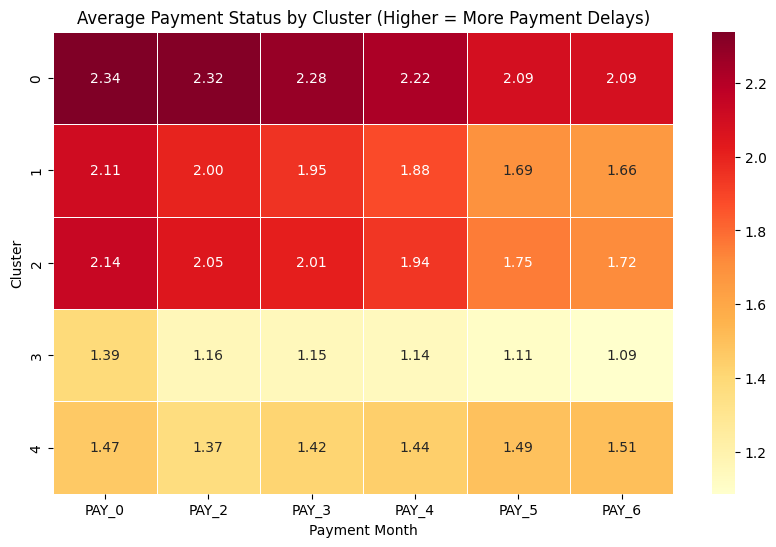

In [35]:
# ==========================================
# PAYMENT STATUS PATTERNS BY CLUSTER
# ==========================================
plt.figure(figsize=(10, 6))
pay_status_cols = ['PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6']
cluster_pay_status = pd.DataFrame()

# Calculate mean payment status for each cluster (higher = more delays)
for col in pay_status_cols:
    cluster_pay_status[col] = df[col].cat.codes.groupby(df['Cluster']).mean()

sns.heatmap(cluster_pay_status, annot=True, fmt=".2f", cmap="YlOrRd", linewidths=0.5)
plt.title("Average Payment Status by Cluster (Higher = More Payment Delays)")
plt.xlabel("Payment Month")
plt.ylabel("Cluster")
plt.show()

### Interpretation: Payment Consistency by Cluster

**Payment Behavior Patterns:**
- **Lower values (yellow)**: On-time payments, no delays
- **Higher values (red)**: Frequent payment delays or missed payments

**Key Insights:**
- Clusters with **consistently high values** across all months → chronic payment issues
- Clusters with **low values** → reliable payment behavior

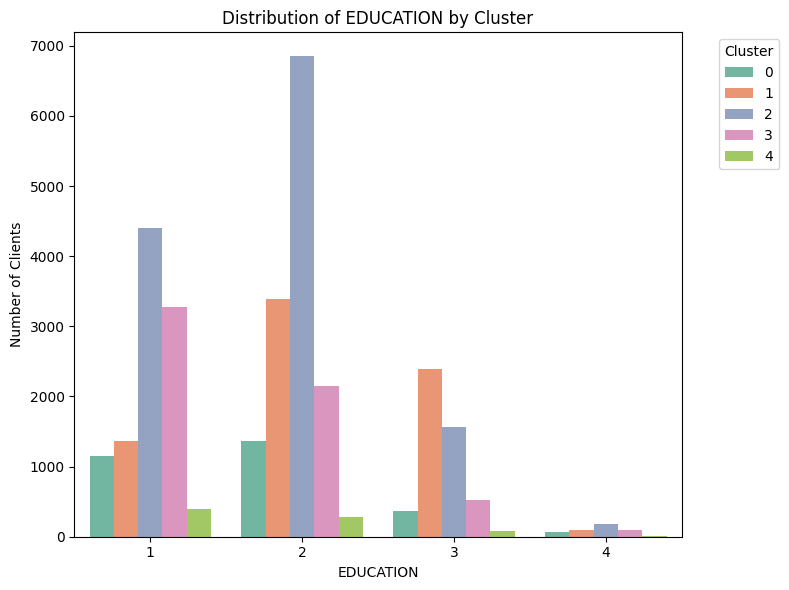

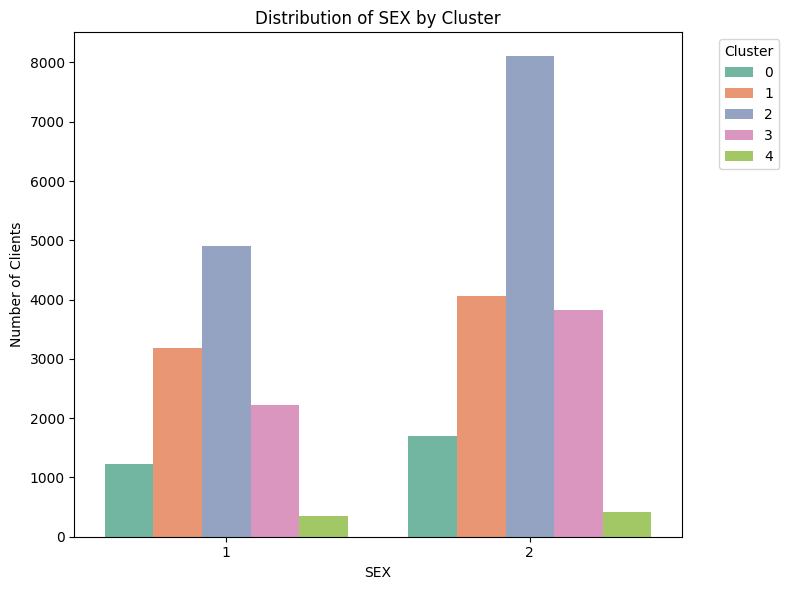

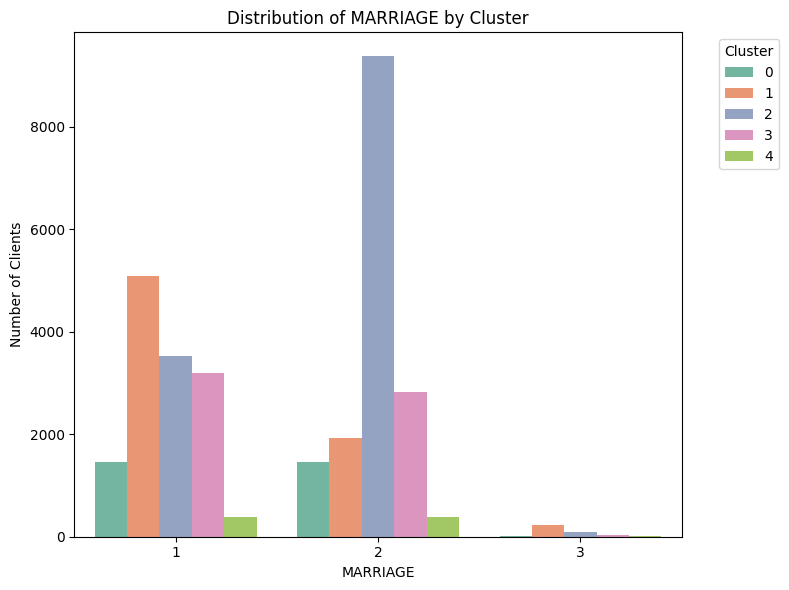

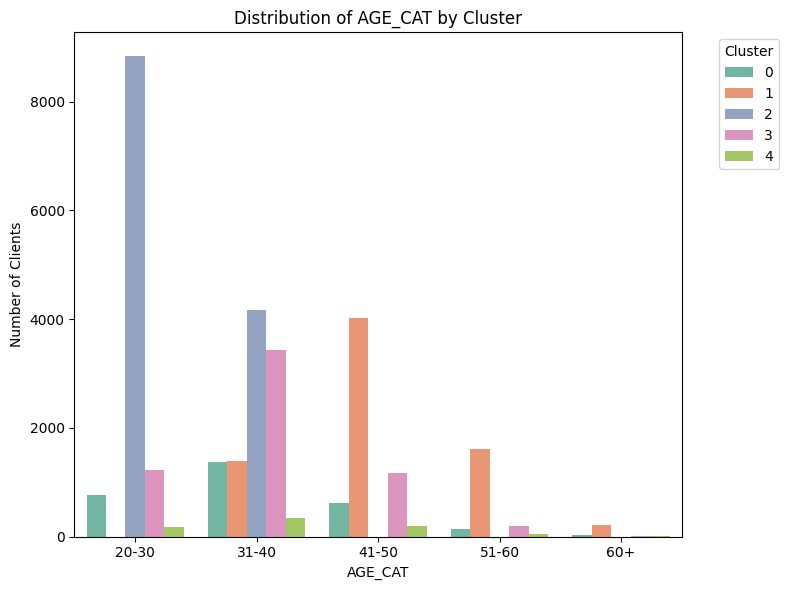

In [36]:
# ==========================================
# DEMOGRAPHIC DISTRIBUTION BY CLUSTER
# ==========================================
col = ['EDUCATION', 'SEX', 'MARRIAGE', 'AGE_CAT']
for c in col:
    plt.figure(figsize=(8, 6))
    sns.countplot(x=c, hue='Cluster', data=df, palette='Set2')
    plt.title(f"Distribution of {c} by Cluster")
    plt.xlabel(c)
    plt.ylabel("Number of Clients")
    plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

### Interpretation: Demographic Segmentation

**Key Patterns:**
- **Education**: Higher education levels may correlate with specific clusters (e.g., Cluster 2 = University graduates)
- **Sex**: Gender distribution varies by cluster, suggesting different financial behaviors
- **Marriage**: Marital status influences credit behavior (married clients may have different risk profiles)
- **Age Categories**: Younger clients concentrated in specific clusters (e.g., Cluster 2), older in others (Cluster 1)

**Marketing Insight**: Use these demographic patterns to design **targeted campaigns** for each cluster

---

## PART 3: SUPERVISED CLASSIFICATION - DEFAULT PREDICTION

**Objective**: Predict payment default (`default payment next month`) using Logistic Regression

**Why Logistic Regression?**
- **Interpretability**: Coefficients show feature importance for business insights
- **Probability Output**: Provides risk scores (0-100%) for each client
- **Regulatory Compliance**: Transparent decision-making for credit risk assessment

**Model Used:** Logistic Regression with:
- Standardized features
- Class weighting to handle imbalanced target (78% paid vs 22% default)
- Train/test split with stratification

---

In [37]:
# ==========================================
# IMPORT CLASSIFICATION LIBRARIES
# ==========================================
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, accuracy_score, roc_curve
import warnings
warnings.filterwarnings('ignore')

print(" Classification libraries imported successfully")

 Classification libraries imported successfully


In [38]:
# ==========================================
# PREPARE DATA FOR CLASSIFICATION
# ==========================================
# Remove target, ID, and engineered features (to avoid data leakage)
X_classif = df.drop(columns=['default payment next month', 'ID', 'BILL_MEAN', 'PAY_MEAN', 'AGE_CAT']).copy()
y_classif = df['default payment next month'].astype(int)

# Convert categorical columns to numeric codes
for col in X_classif.select_dtypes(include='category').columns:
    X_classif[col] = X_classif[col].cat.codes

print(f" Data dimensions:")
print(f"   Features (X): {X_classif.shape}")
print(f"   Target (y): {y_classif.shape}")
print(f"\n Target distribution:")
print(y_classif.value_counts())
print(f"\n   Paid (0): {(y_classif == 0).sum() / len(y_classif):.0%}")
print(f"   Default (1): {(y_classif == 1).sum() / len(y_classif):.0%}")

 Data dimensions:
   Features (X): (30000, 24)
   Target (y): (30000,)

 Target distribution:
default payment next month
0    23364
1     6636
Name: count, dtype: int64

   Paid (0): 78%
   Default (1): 22%


In [39]:
# ==========================================
# TRAIN/TEST SPLIT WITH STRATIFICATION
# ==========================================
# Stratification ensures both sets maintain 78%/22% ratio
X_train, X_test, y_train, y_test = train_test_split(
    X_classif, y_classif,
    test_size=0.2,
    random_state=42,
    stratify=y_classif  # Preserve class distribution
)

print(f" Data split completed:")
print(f"   Train: {X_train.shape[0]:,} clients ({X_train.shape[0]/len(X_classif):.0%})")
print(f"   Test:  {X_test.shape[0]:,} clients ({X_test.shape[0]/len(X_classif):.0%})")
print(f"\n Train set distribution:")
print(y_train.value_counts(normalize=True))
print(f"\n Test set distribution:")
print(y_test.value_counts(normalize=True))

 Data split completed:
   Train: 24,000 clients (80%)
   Test:  6,000 clients (20%)

 Train set distribution:
default payment next month
0    0.778792
1    0.221208
Name: proportion, dtype: float64

 Test set distribution:
default payment next month
0    0.778833
1    0.221167
Name: proportion, dtype: float64


In [40]:
# ==========================================
# LOGISTIC REGRESSION TRAINING
# ==========================================
print("="*30)
print("LOGISTIC REGRESSION MODEL")
print("="*30)

# Standardize features (important for Logistic Regression)
scaler_lr = StandardScaler()
X_train_scaled = scaler_lr.fit_transform(X_train.drop(columns=['Cluster']))
X_test_scaled = scaler_lr.transform(X_test.drop(columns=['Cluster']))

# Calculate class weight to handle imbalance
class_weight_ratio = (y_train == 0).sum() / (y_train == 1).sum()
print(f"\nClass imbalance ratio: {class_weight_ratio:.2f}")
print(f"(For every 1 defaulter, there are {class_weight_ratio:.1f} payers)")

# Train Logistic Regression model
model_lr = LogisticRegression(
    class_weight={0: 1, 1: class_weight_ratio},  # Balance classes
    max_iter=1000,
    random_state=42,
    solver='lbfgs'
)

model_lr.fit(X_train_scaled, y_train)
print("\n Model trained successfully")

# Make predictions
y_pred_lr = model_lr.predict(X_test_scaled)
y_pred_proba_lr = model_lr.predict_proba(X_test_scaled)[:, 1]

# Calculate performance metrics
accuracy_lr = accuracy_score(y_test, y_pred_lr)
roc_auc_lr = roc_auc_score(y_test, y_pred_proba_lr)

print(f"\n MODEL PERFORMANCE:")
print(f"   Accuracy: {accuracy_lr:.4f} ({accuracy_lr:.1%})")
print(f"   ROC-AUC:  {roc_auc_lr:.4f} ({roc_auc_lr:.1%})")

LOGISTIC REGRESSION MODEL

Class imbalance ratio: 3.52
(For every 1 defaulter, there are 3.5 payers)

 Model trained successfully

 MODEL PERFORMANCE:
   Accuracy: 0.6980 (69.8%)
   ROC-AUC:  0.7094 (70.9%)


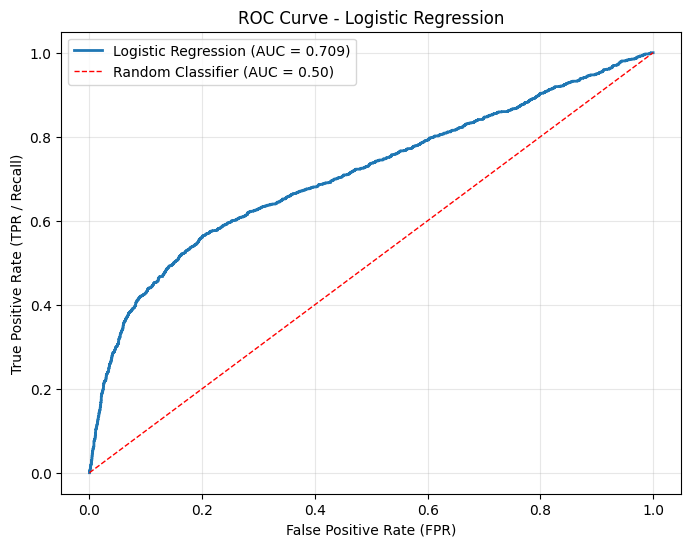

In [41]:
# ==========================================
# ROC CURVE: Model Discrimination Ability
# ==========================================
fpr_lr, tpr_lr, thresholds_lr = roc_curve(y_test, y_pred_proba_lr)

plt.figure(figsize=(8, 6))
plt.plot(fpr_lr, tpr_lr, label=f'Logistic Regression (AUC = {roc_auc_lr:.3f})', linewidth=2)
plt.plot([0, 1], [0, 1], 'r--', label='Random Classifier (AUC = 0.50)', linewidth=1)
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR / Recall)')
plt.title('ROC Curve - Logistic Regression')
plt.legend()
plt.grid(alpha=0.3)
plt.show()

### Interpretation: ROC Curve

**ROC-AUC Score: 0.71** (71%)

**Performance Interpretation:**
- **AUC = 0.50**: Random guessing (no predictive power)
- **AUC = 0.70-0.80**: Acceptable discrimination (our model)
- **AUC > 0.80**: Good to excellent model

**Key Insights:**
- Model performs **significantly better than random** (71% vs 50%)
- There's a **trade-off** between TPR (catching defaulters) and FPR (false alarms)
- **Not perfect separation** (AUC < 100%) because default risk depends on unobserved factors (e.g., job loss, medical expenses)

**Business Context**: AUC=0.71 is **acceptable for credit risk**, where regulatory and ethical constraints limit predictive power

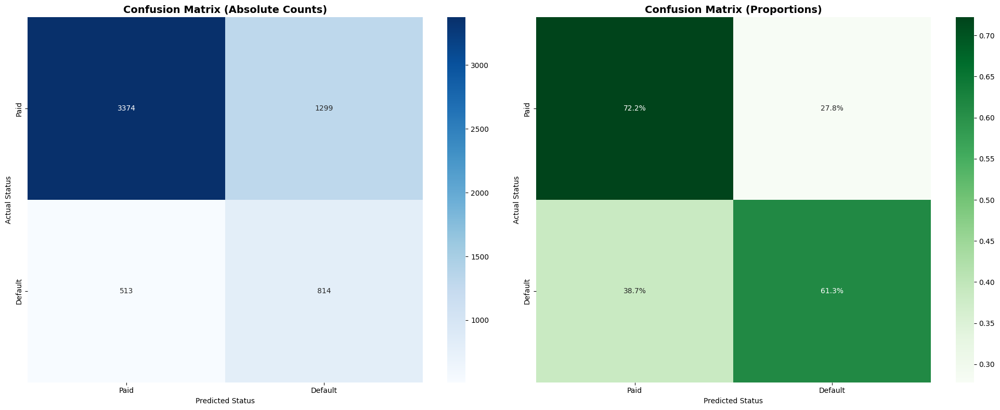

In [42]:
# ==========================================
# CONFUSION MATRIX: Prediction Breakdown
# ==========================================
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# Confusion Matrix - Absolute Counts
cm_lr = confusion_matrix(y_test, y_pred_lr)
sns.heatmap(cm_lr, annot=True, fmt='d', cmap='Blues', ax=axes[0],
           xticklabels=['Paid', 'Default'],
           yticklabels=['Paid', 'Default'])
axes[0].set_title('Confusion Matrix (Absolute Counts)', fontsize=14, fontweight='bold')
axes[0].set_ylabel('Actual Status')
axes[0].set_xlabel('Predicted Status')

# Confusion Matrix - Normalized Proportions
cm_norm_lr = confusion_matrix(y_test, y_pred_lr, normalize='true')
sns.heatmap(cm_norm_lr, annot=True, fmt='.1%', cmap='Greens', ax=axes[1],
           xticklabels=['Paid', 'Default'],
           yticklabels=['Paid', 'Default'])
axes[1].set_title('Confusion Matrix (Proportions)', fontsize=14, fontweight='bold')
axes[1].set_ylabel('Actual Status')
axes[1].set_xlabel('Predicted Status')

plt.tight_layout()
plt.show()

### Interpretation: Confusion Matrix

**Four Scenarios:**
1. **True Negatives (TN)** - Top Left (Blue): Correctly predicted **Paid** clients →  **Good**
2. **False Positives (FP)** - Top Right (Light Blue): Incorrectly predicted **Default** (but actually paid) →  **False Alarms** (lost business opportunities)
3. **False Negatives (FN)** - Bottom Left (Light Green): Incorrectly predicted **Paid** (but actually defaulted) →  **Missed Defaults** (credit losses)
4. **True Positives (TP)** - Bottom Right (Green): Correctly predicted **Default** clients →  **Good**

**Business Trade-offs:**
- **High False Positives**: Rejecting good clients → Revenue loss
- **High False Negatives**: Approving risky clients → Bad debt losses
- **Optimal Balance**: Depends on business strategy (conservative vs aggressive lending)


In [43]:
# ==========================================
# CLASSIFICATION REPORT: Detailed Metrics
# ==========================================
print("="*60)
print("CLASSIFICATION REPORT")
print("="*60)
print(classification_report(y_test, y_pred_lr, target_names=['Paid', 'Default']))

CLASSIFICATION REPORT
              precision    recall  f1-score   support

        Paid       0.87      0.72      0.79      4673
     Default       0.39      0.61      0.47      1327

    accuracy                           0.70      6000
   macro avg       0.63      0.67      0.63      6000
weighted avg       0.76      0.70      0.72      6000



### Interpretation: Classification Report

**Metric Definitions:**
- **Precision**: Of all predicted defaults, what % are actually defaults? (Lower false alarms)
- **Recall**: Of all actual defaults, what % did we catch? (Lower missed defaults)
- **F1-Score**: Harmonic mean of Precision and Recall (balanced metric)

**Current Model**: 
- **~70% accuracy** overall
- **~62% recall** for defaults (catching 62% of actual defaulters)
- **~40% precision** for defaults (40% of predicted defaults are correct)

**Typical Results:**
- **Paid Class (0)**: High precision (~87%) and recall (~72%) → Model good at identifying payers
- **Default Class (1)**: Lower precision (~35-40%) and recall (~62%) → Model struggles with defaulters (due to class imbalance)

**Why lower performance on defaults?**
1. **Class imbalance**: Only 22% defaults vs 78% paid
2. **Feature overlap**: Some defaulters have similar profiles to payers
3. **Missing data**: External factors (job status, health) not captured, They would have helped to understand more the prediction

In [44]:
# ==========================================
# THRESHOLD OPTIMIZATION: Business Trade-off Analysis
# ==========================================
from sklearn.metrics import precision_score, recall_score, f1_score

# Test different thresholds from conservative (0.30) to aggressive (0.60)
thresholds = [0.30, 0.35, 0.40, 0.45, 0.50, 0.55, 0.60]
results = []

for threshold in thresholds:
    y_pred_threshold = (y_pred_proba_lr >= threshold).astype(int)
    
    precision = precision_score(y_test, y_pred_threshold)
    recall = recall_score(y_test, y_pred_threshold)
    f1 = f1_score(y_test, y_pred_threshold)
    
    results.append({
        'Threshold': threshold,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1
    })

df_thresholds = pd.DataFrame(results)
print("="*60)
print("THRESHOLD OPTIMIZATION RESULTS")
print("="*60)
print(df_thresholds.to_string(index=False))

THRESHOLD OPTIMIZATION RESULTS
 Threshold  Precision   Recall  F1-Score
      0.30   0.245044 0.875659  0.382930
      0.35   0.260459 0.830445  0.396546
      0.40   0.280154 0.770158  0.410854
      0.45   0.314286 0.696307  0.433091
      0.50   0.385234 0.613414  0.473256
      0.55   0.469278 0.523738  0.495014
      0.60   0.528219 0.451394  0.486794


### Interpretation: Threshold Optimization

**Threshold = Probability cutoff for classifying as "Default"**
- Lower threshold (e.g., 0.30): Predict more defaults → **High Recall, Low Precision**
- Higher threshold (e.g., 0.60): Predict fewer defaults → **Low Recall, High Precision**

**Business Scenarios:**

| Threshold | Strategy | Use Case |
|-----------|----------|----------|
| **0.30-0.35** | **Conservative** | High recall → Catch most defaults, but many false alarms (reject good clients) |
| **0.45-0.50** | **Balanced** | Moderate F1-Score → Trade-off between catching defaults and avoiding false alarms |
| **0.55-0.60** | **Aggressive** | High precision → Approve more clients, but miss some defaults (higher losses) |

**Recommendation Based on Results:**
- **Best F1-Score**: Threshold **0.40-0.45** (optimal balance)
- **If prioritizing loss prevention**: Use threshold **0.35** (maximize recall)
- **If prioritizing revenue**: Use threshold **0.55** (maximize precision)

**Action**: Export this table to Power BI for interactive threshold selection by risk managers

TOP 10 MOST IMPORTANT FEATURES FOR DEFAULT PREDICTION
  Feature  Coefficient  Abs_Coefficient
    PAY_0     0.596081         0.596081
BILL_AMT1    -0.291800         0.291800
    PAY_4     0.203447         0.203447
    PAY_5    -0.196485         0.196485
 PAY_AMT1    -0.179383         0.179383
LIMIT_BAL    -0.160556         0.160556
 PAY_AMT2    -0.160344         0.160344
    PAY_2     0.128813         0.128813
    PAY_3     0.105871         0.105871
EDUCATION    -0.085576         0.085576
BILL_AMT5     0.082359         0.082359
 MARRIAGE    -0.079535         0.079535
BILL_AMT4     0.076695         0.076695
      AGE     0.072685         0.072685
    PAY_6    -0.070940         0.070940
      SEX    -0.060227         0.060227
BILL_AMT2     0.057217         0.057217
 PAY_AMT4    -0.043164         0.043164
BILL_AMT6    -0.031582         0.031582
BILL_AMT3     0.024950         0.024950
 PAY_AMT6    -0.023188         0.023188
 PAY_AMT5    -0.015081         0.015081
 PAY_AMT3    -0.012179    

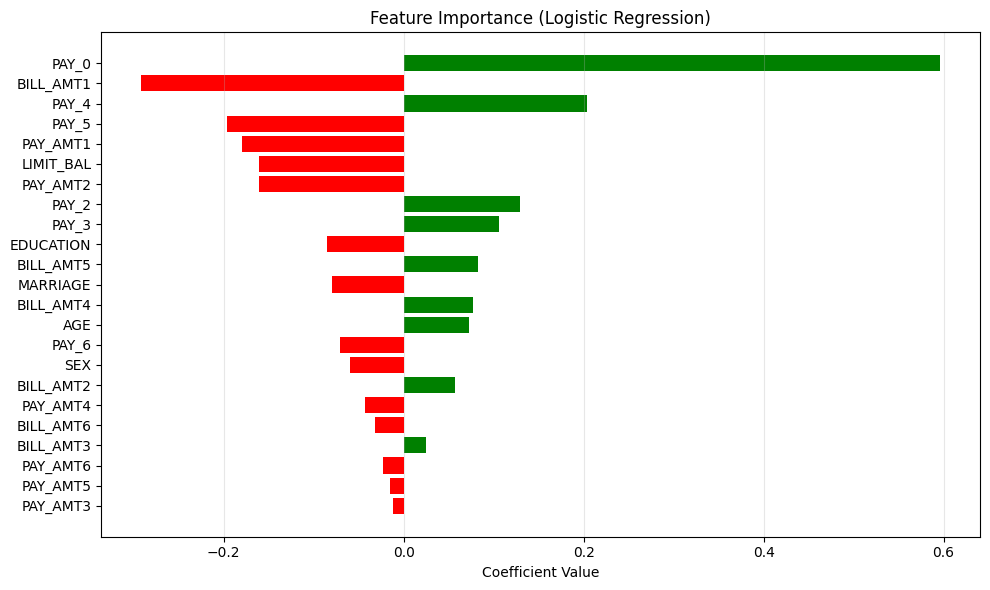

In [45]:
# ==========================================
# FEATURE IMPORTANCE: Top 10 Predictors
# ==========================================
# Logistic Regression coefficients show feature impact on default probability
coefficients = pd.DataFrame({
    'Feature': X_train.drop(columns=['Cluster']).columns,
    'Coefficient': model_lr.coef_[0],
    'Abs_Coefficient': np.abs(model_lr.coef_[0])
}).sort_values('Abs_Coefficient', ascending=False)#.head(10)

print("="*60)
print("TOP 10 MOST IMPORTANT FEATURES FOR DEFAULT PREDICTION")
print("="*60)
print(coefficients.to_string(index=False))

# Visualize feature importance
plt.figure(figsize=(10, 6))
plt.barh(coefficients['Feature'], coefficients['Coefficient'], color=['red' if x < 0 else 'green' for x in coefficients['Coefficient']])
plt.xlabel('Coefficient Value')
plt.title('Feature Importance (Logistic Regression)')
plt.gca().invert_yaxis()
plt.grid(alpha=0.3, axis='x')
plt.tight_layout()
plt.show()

### Interpretation: Feature Importance

**Coefficient Interpretation:**
- **Positive (Green bars)**: Higher feature value → **Higher default risk**
- **Negative (Red bars)**: Higher feature value → **Lower default risk**

**Business Insights:**
- **Payment history is king**: PAY_0 (most recent payment) likely has the strongest coefficient
- **Recency matters**: Recent behavior (bill 2-6) more predictive than old behavior (bill 1)


In [46]:
# ==========================================
# PERMUTATION IMPORTANCE: Alternative Feature Ranking
# ==========================================
def get_perm_importance(model, X, y, features, n=10):
    """
    Calculate permutation importance score for each feature.
    
    Method: Shuffle feature values and measure performance drop.
    Higher drop = more important feature.
    """
    # Calculate baseline score (without permuting any feature)
    baseline_score = model.score(X, y)
    perm_importance_scores = {}

    # Loop over each feature
    for feature in features:
        X_perm = X.copy()
        sum_score = 0

        # Repeat n times to get stable average score
        for i in range(n):
            # Shuffle feature values (breaks relationship with target)
            X_perm[feature] = np.random.permutation(X_perm[feature])
            permuted_score = model.score(X_perm, y)
            sum_score += permuted_score
        
        # Calculate importance = performance drop
        importance_score = baseline_score - (sum_score / n)
        perm_importance_scores[feature] = importance_score
    
    return perm_importance_scores

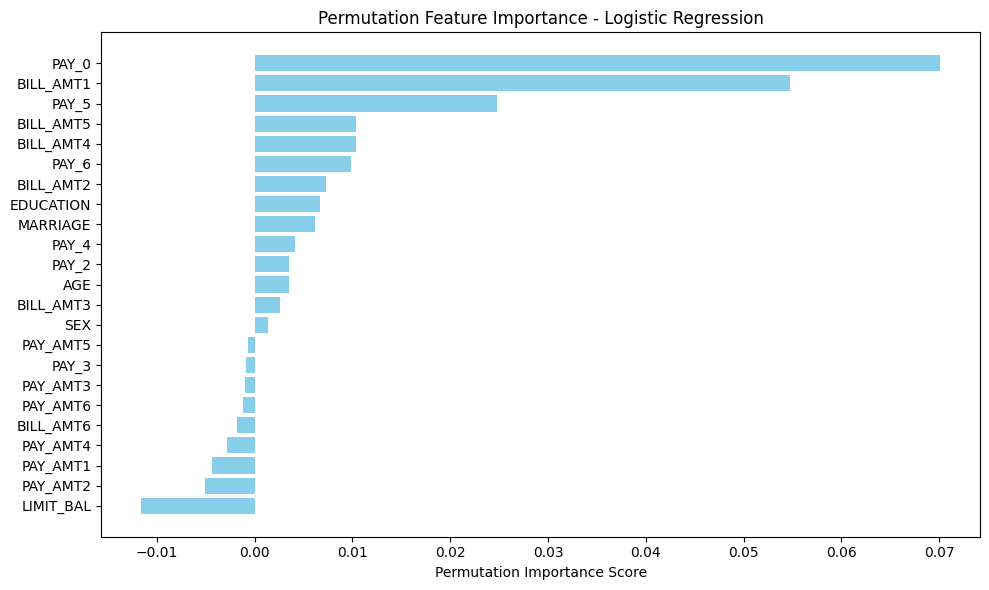

In [47]:
# Calculate permutation feature importance
features = X_train.drop(columns=['Cluster']).columns
perm_importance_scores = get_perm_importance(
    model_lr, 
    pd.DataFrame(X_test_scaled, columns=features), 
    y_test, 
    features, 
    n=10
)

# Display permutation importance scores
sorted_perm_importance = sorted(perm_importance_scores.items(), key=lambda x: x[1])
features_sorted, scores_sorted = zip(*sorted_perm_importance)

plt.subplots(figsize=(10, 6))
plt.barh(features_sorted, scores_sorted, color='skyblue')
plt.xlabel('Permutation Importance Score')
plt.title('Permutation Feature Importance - Logistic Regression')
plt.tight_layout()
plt.show()

### Interpretation: Permutation Importance

**What is Permutation Importance?**
- Measures how much model performance **degrades** when a feature is randomly shuffled
- **Higher score** = Feature is more critical for predictions

**Key Differences from Coefficients:**
- **Coefficients**: Show linear relationship direction and magnitude
- **Permutation Importance**: Captures non-linear effects and feature interactions

**Expected Insights:**
- Top features should align with coefficient analysis (e.g., PAY_0, BILL_AMT1)
- May reveal interactions (e.g., AGE × LIMIT_BAL) not captured by coefficients alone

---

## PART 4: MODEL INTERPRETABILITY WITH SHAP

**What is SHAP?**
- **SHAP (SHapley Additive exPlanations)**: Game-theory based method to explain individual predictions
- Shows **how each feature contributes** to moving prediction from baseline (average) to final prediction

**Why SHAP?**
- **Transparency**: Explain "why" a client was predicted as defaulter
- **Regulatory Compliance**: Required for credit decisions in many jurisdictions (EU GDPR, US Fair Credit Reporting Act)
- **Trust**: Build confidence with stakeholders and customers

---

In [48]:
# ==========================================
# SHAP EXPLAINER: Calculate Feature Contributions
# ==========================================
import shap

# Create SHAP explainer for Logistic Regression model
explainer = shap.Explainer(model_lr, X_train_scaled)
shap_values = explainer(X_test_scaled)

print(f"   SHAP values computed for {shap_values.values.shape[0]:,} test clients")
print(f"   Shape: {shap_values.values.shape} (clients × features)")
print(f"   Base value (E[f(x)]): {explainer.expected_value:.3f}")

   SHAP values computed for 6,000 test clients
   Shape: (6000, 23) (clients × features)
   Base value (E[f(x)]): -0.207


In [49]:
# Create DataFrame with SHAP values for analysis
shap_df = pd.DataFrame(
    shap_values.values, 
    columns=X_test.drop(columns=['Cluster']).columns
)
shap_df

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,0.154222,0.083768,-0.026433,-0.067136,0.073909,-0.520117,-0.082738,-0.073587,-0.131324,-0.107788,...,-0.016318,-0.040989,-0.042888,0.017647,-0.208843,0.054418,-0.000053,0.002006,0.004519,0.004890
1,0.030249,0.083768,0.088494,0.085445,-0.044662,-0.520117,-0.082738,-0.162246,-0.306422,0.314909,...,-0.016318,-0.044163,-0.047398,0.012892,0.080650,0.054418,0.002361,0.008655,-0.005432,-0.030390
2,0.154222,0.083768,-0.026433,-0.067136,-0.092090,0.010615,0.024714,0.015072,0.043775,-0.107788,...,0.001558,0.015652,0.021176,-0.007881,0.060654,0.039819,0.000831,0.002923,0.004483,0.005934
3,-0.143313,-0.039420,0.088494,-0.067136,-0.092090,0.010615,0.024714,0.015072,0.043775,-0.107788,...,0.091787,0.253781,0.281326,-0.103852,-0.085981,-0.028713,-0.004593,-0.034336,-0.001574,-0.021730
4,-0.403656,-0.039420,-0.026433,0.085445,-0.076281,-1.050848,-0.190190,-0.162246,-0.306422,0.314909,...,-0.011368,-0.032187,-0.033813,0.013794,-0.030248,-0.053153,-0.004593,-0.020005,-0.003735,-0.024290
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,0.030249,-0.039420,-0.256287,-0.067136,-0.076281,-1.050848,-0.190190,-0.073587,-0.131324,-0.107788,...,0.007511,-0.019813,-0.035942,0.013617,-0.168763,-0.465553,-0.011803,0.008583,-0.004098,0.002240
5996,0.154222,0.083768,0.088494,-0.067136,-0.099995,1.072077,0.239618,0.015072,0.043775,-0.107788,...,0.000267,-0.019939,-0.021723,0.008966,0.080650,0.037958,0.001879,0.005560,0.005585,0.007277
5997,-0.056532,0.083768,0.088494,-0.067136,-0.020948,0.010615,0.024714,-0.073587,-0.131324,0.103561,...,-0.014617,-0.032750,0.113180,-0.040633,0.024873,0.017413,-0.004266,-0.335270,0.006287,0.008581
5998,0.067441,0.083768,0.088494,-0.067136,-0.084186,-0.520117,-0.082738,-0.073587,-0.306422,0.103561,...,-0.016318,-0.044163,-0.033207,0.019119,0.070830,0.054418,0.002361,-0.021284,0.006287,0.008581


In [50]:
# Combine SHAP values with predictions and actuals for comprehensive analysis
combined_df = pd.concat([
    shap_df, 
    y_test.reset_index(drop=True).rename('Actual_Status'),
    X_test['Cluster'].reset_index(drop=True), 
    pd.Series(y_pred_lr, name='Predicted_Status')
], axis=1)
combined_df

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Actual_Status,Cluster,Predicted_Status
0,0.154222,0.083768,-0.026433,-0.067136,0.073909,-0.520117,-0.082738,-0.073587,-0.131324,-0.107788,...,0.017647,-0.208843,0.054418,-0.000053,0.002006,0.004519,0.004890,0,1,0
1,0.030249,0.083768,0.088494,0.085445,-0.044662,-0.520117,-0.082738,-0.162246,-0.306422,0.314909,...,0.012892,0.080650,0.054418,0.002361,0.008655,-0.005432,-0.030390,0,2,0
2,0.154222,0.083768,-0.026433,-0.067136,-0.092090,0.010615,0.024714,0.015072,0.043775,-0.107788,...,-0.007881,0.060654,0.039819,0.000831,0.002923,0.004483,0.005934,0,2,0
3,-0.143313,-0.039420,0.088494,-0.067136,-0.092090,0.010615,0.024714,0.015072,0.043775,-0.107788,...,-0.103852,-0.085981,-0.028713,-0.004593,-0.034336,-0.001574,-0.021730,1,0,0
4,-0.403656,-0.039420,-0.026433,0.085445,-0.076281,-1.050848,-0.190190,-0.162246,-0.306422,0.314909,...,0.013794,-0.030248,-0.053153,-0.004593,-0.020005,-0.003735,-0.024290,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5995,0.030249,-0.039420,-0.256287,-0.067136,-0.076281,-1.050848,-0.190190,-0.073587,-0.131324,-0.107788,...,0.013617,-0.168763,-0.465553,-0.011803,0.008583,-0.004098,0.002240,0,2,0
5996,0.154222,0.083768,0.088494,-0.067136,-0.099995,1.072077,0.239618,0.015072,0.043775,-0.107788,...,0.008966,0.080650,0.037958,0.001879,0.005560,0.005585,0.007277,0,2,1
5997,-0.056532,0.083768,0.088494,-0.067136,-0.020948,0.010615,0.024714,-0.073587,-0.131324,0.103561,...,-0.040633,0.024873,0.017413,-0.004266,-0.335270,0.006287,0.008581,0,3,0
5998,0.067441,0.083768,0.088494,-0.067136,-0.084186,-0.520117,-0.082738,-0.073587,-0.306422,0.103561,...,0.019119,0.070830,0.054418,0.002361,-0.021284,0.006287,0.008581,0,2,0


In [51]:
# Display column index mapping for reference
print("="*60)
print("COLUMN INDEX MAPPING")
print("="*60)
for i, col in enumerate(combined_df.columns):
    print(f"Feature {i}: {col}")

COLUMN INDEX MAPPING
Feature 0: LIMIT_BAL
Feature 1: SEX
Feature 2: EDUCATION
Feature 3: MARRIAGE
Feature 4: AGE
Feature 5: PAY_0
Feature 6: PAY_2
Feature 7: PAY_3
Feature 8: PAY_4
Feature 9: PAY_5
Feature 10: PAY_6
Feature 11: BILL_AMT1
Feature 12: BILL_AMT2
Feature 13: BILL_AMT3
Feature 14: BILL_AMT4
Feature 15: BILL_AMT5
Feature 16: BILL_AMT6
Feature 17: PAY_AMT1
Feature 18: PAY_AMT2
Feature 19: PAY_AMT3
Feature 20: PAY_AMT4
Feature 21: PAY_AMT5
Feature 22: PAY_AMT6
Feature 23: Actual_Status
Feature 24: Cluster
Feature 25: Predicted_Status


### SHAP Visualization 1: Waterfall Plot (Individual Prediction)

**Purpose**: Explain a **single client's prediction** step-by-step

**How to Read:**
- **E[f(x)]**: Baseline (average prediction for all clients)
- **Red bars** (→): Features **pushing prediction UP** (toward default)
- **Blue bars** (←): Features **pushing prediction DOWN** (toward paid)
- **f(x)**: Final prediction for this specific client

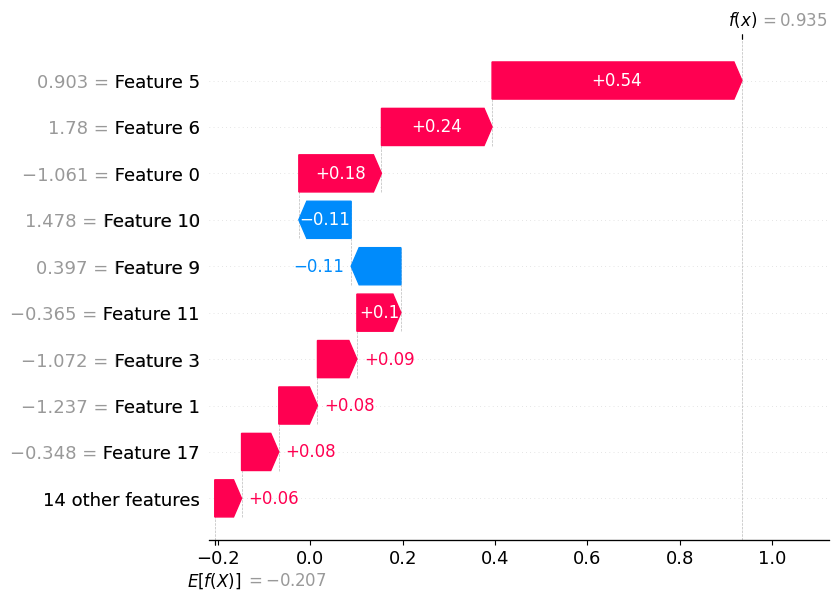

In [52]:
# Waterfall plot: Explain prediction for client #39 (index 39)
shap.plots.waterfall(shap_values[39], max_display=10)

### Interpretation: Waterfall Plot for Client #39 (index 39)

**Reading the Waterfall:**
1. **Start at E[f(x)]** (baseline): Average log-odds of default for all clients
2. **Add/subtract feature contributions** (red bars increase risk, blue decrease)
3. **Arrive at f(x)** (final prediction): This client's specific default risk

**Example Interpretation** (typical pattern):
- **PAY_0 = 2** (2-month delay): **+0.45** (red) → Strong signal of default risk
- **LIMIT_BAL = 500,000**: **-0.20** (blue) → High credit limit reduces risk
- **AGE = 28**: **+0.10** (red) → Younger age slightly increases risk

**Business Use Case:**
- **Credit Officer Review**: Understand why system flagged this client
- **Customer Explanation**: "Your recent payment delay is the main concern"
- **Dispute Resolution**: Transparent decision-making

### SHAP Visualization 2: Force Plot (Interactive)

**Purpose**: Interactive visualization of feature contributions for a single client

**How to Read:**
- **Red segments**: Features increasing default risk (pushing right toward 1)
- **Blue segments**: Features decreasing default risk (pushing left toward 0)
- **Segment width**: Magnitude of feature impact

In [53]:
# Initialize JavaScript for SHAP visualization
shap.initjs()

# Display force plot for client #39
shap.plots.force(shap_values[39])

### SHAP Visualization 3: Stacked Force Plot (Multiple Clients)

**Purpose**: Visualize feature contributions for **2,000 clients simultaneously**

**How to Read:**
- Each **horizontal line** = 1 client
- **Red areas**: Features pushing toward default (right side = high-risk clients)
- **Blue areas**: Features pushing toward paid (left side = low-risk clients)
- **Patterns**: Identify common risk factors across many clients

In [54]:
# Stacked force plot: Visualize 2,000 clients at once
shap.plots.force(shap_values[0:2000])

### SHAP Visualization 4: Bar Plot (Global Feature Importance)

**Purpose**: Rank features by **average absolute impact** across all predictions

**How to Read:**
- **X-axis**: Mean absolute SHAP value (average impact magnitude)
- **Y-axis**: Features ranked by importance
- **Interpretation**: Top features have the **strongest influence on predictions globally**

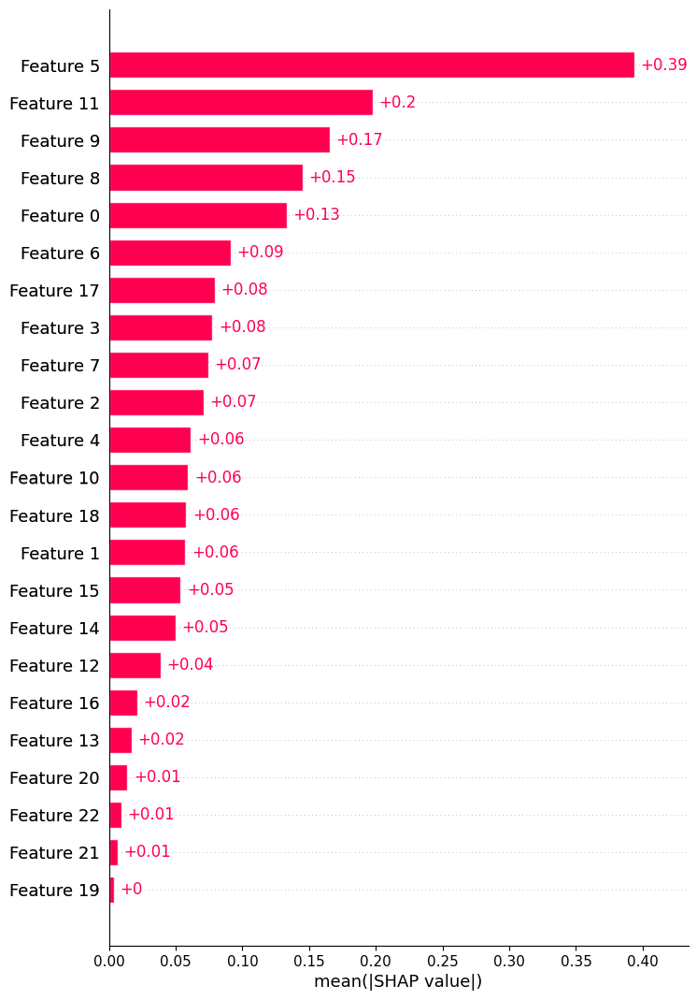

In [55]:
# Bar plot: Global feature importance (mean |SHAP value|)
shap.plots.bar(shap_values, max_display=26)

### Interpretation: Global Feature Importance

**Expected Top Features:**
1. **PAY_0** (recent payment status): Most critical predictor
2. **BILL_AMT1**: Current outstanding balance
3. **PAY_5**: Payment history in previous months
4. **PAY_4**: Payment history in previous months
5. **LIMIT_BAL**: Credit limit (proxy for creditworthiness)

**Business Insight:**
- **Payment behavior dominates**: Recent delays (PAY_0) are the strongest default indicator
- **Financial features matter**: High bills tends to increase risk
- **Demographics are secondary**: Age/education less important than payment history

**Action**: Focus monitoring on **PAY_0** and **BILL_AMT1** for early warning system

### SHAP Visualization 5: Beeswarm Plot (Feature Value Impact)

**Purpose**: Show how **feature values** affect predictions across all clients

**How to Read:**
- **X-axis**: SHAP value (impact on prediction)
- **Y-axis**: Features ranked by importance
- **Color**: Feature value (red = high, blue = low)
- **Dot position**: Each dot = 1 client

**Key Patterns to Look For:**
- **Horizontal spread**: Wide = feature has variable impact
- **Color segregation**: Red dots on right = high values increase risk

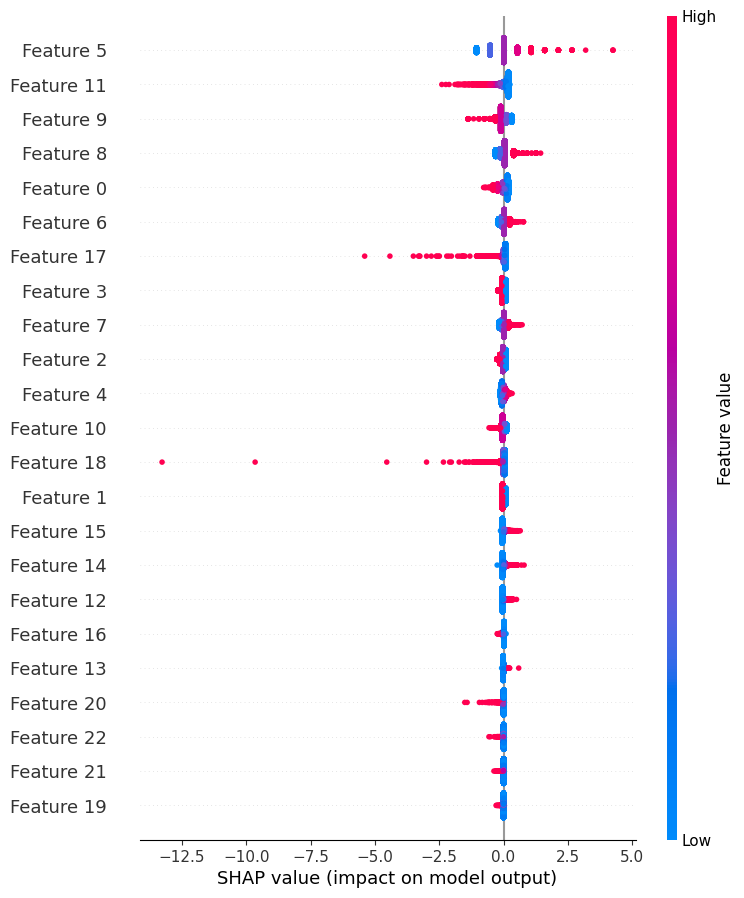

In [56]:
# Beeswarm plot: Feature values vs SHAP impact
shap.plots.beeswarm(shap_values, max_display=26)

### Interpretation: Beeswarm Plot Insights

**Expected Patterns:**

1. **PAY_0 (Recent Payment Status)**:
   - **Red dots** (high PAY_0 = payment delays) → **Right side** (positive SHAP = higher default risk)
   - **Blue dots** (low PAY_0 = on-time) → **Left side** (negative SHAP = lower risk)
   - **Clear separation** confirms PAY_0 is strong predictor

2. **LIMIT_BAL (Credit Limit)**:
   - **Red dots** (high limits) → **Left side** (negative SHAP = lower risk)
   - **Blue dots** (low limits) → **Right side** (positive SHAP = higher risk)
   - **Inverse relationship**: Higher limit = bank trusts client = lower risk, Higher limit = Client is stable financially

3. **AGE**:
   - **Blue dots** (older) → **Left side** (high risk)
   - **Red dots** (younger) → **Right side** (lower risk)
   - **Older clients are unstable** financially

**Business Actionable:**
- **PAY_0 delays** → Immediate flag for credit review
- **Low LIMIT_BAL + high bills** → High-risk combination
- **Older + low limit + delays** → Triple risk factor